In [ ]:
!export KAGGLE_CONFIG_DIR=~/content/kaggle.json

In [ ]:
!pip install ipyplot

In [ ]:
!pip install colorama

In [ ]:
!pip install keras-tuner --upgrade

# **Download Dataset**

In [ ]:
import os

# Set the path to the directory containing kaggle.json
kaggle_config_dir = '/content/'

# Set the KAGGLE_CONFIG_DIR environment variable
os.environ['KAGGLE_CONFIG_DIR'] = kaggle_config_dir

# Move the uploaded kaggle.json file to the specified directory
!mv kaggle.json $kaggle_config_dir

# Verify the contents of the directory
!ls $kaggle_config_dir

# Install the Kaggle Python package
!pip install kaggle

# Set appropriate permissions to the kaggle.json file
!chmod 600 $kaggle_config_dir/kaggle.json


mv: 'kaggle.json' and '/content/kaggle.json' are the same file
extracted  kaggle.json	sample_data


In [ ]:
!kaggle datasets download -d khlaifiabilel/military-aircraft-recognition-dataset

 99% 1.12G/1.13G [00:14<00:00, 80.0MB/s]
100% 1.13G/1.13G [00:14<00:00, 84.0MB/s]


# **Treating Data to load**

In [ ]:
import os
from PIL import Image
import ipyplot
import pandas as pd
import numpy as np
import os
import xml.etree.ElementTree as ET
from colorama import Fore, Back, Style
import random
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from PIL import Image, ImageDraw
import itertools
from sklearn.preprocessing import OneHotEncoder
import keras_tuner as kt
import zipfile
import os
import plotly.subplots as sp
import plotly.graph_objects as go
from PIL import Image


        WARNING! Google Colab Environment detected!
        You might encounter issues while running in Google Colab environment.
        If images are not displaying properly please try setting `force_b64` param to `True`.
        


In [ ]:
# Specify the path to your ZIP file
zip_file_path = '/content/military-aircraft-recognition-dataset.zip'

# Specify the directory where you want to extract the contents
extracted_dir = '/content/extracted/'

# Create the target directory if it doesn't exist
!mkdir -p $extracted_dir

# Unzip the file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_dir)

# List the contents of the extracted directory
!ls $extracted_dir


Annotations  ImageSets	JPEGImages


In [ ]:
image_files = [f for f in os.listdir(extracted_dir) if (f.endswith('.jpg') or f.endswith('.png'))][:10]
print(image_files )

['1508.jpg', '2461.jpg', '1560.jpg', '402.jpg', '2424.jpg', '2656.jpg', '3225.jpg', '2736.jpg', '1165.jpg', '1114.jpg']


# Analysing Dataset

In [ ]:
# Create a list to store Image objects
images = []

# Visualize the images
for image_file in image_files:
    # Specify the full path to the image
    image_path = os.path.join(extracted_dir, image_file)

    # Open the image using Pillow
    img = Image.open(image_path)

    # Append the image to the list
    images.append(img)


In [ ]:
image_list = [np.array(image) for image in images]


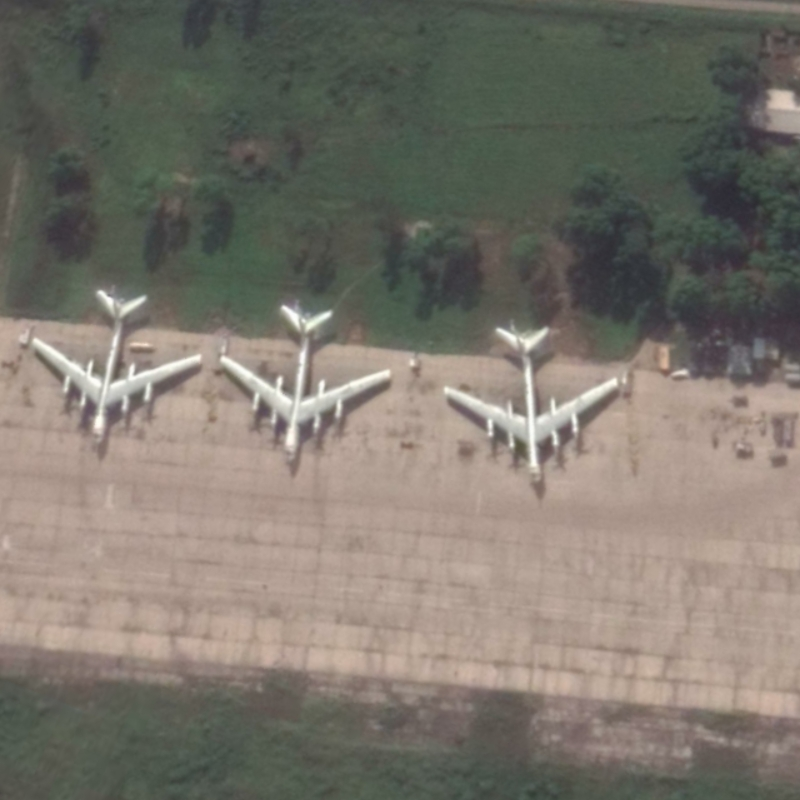
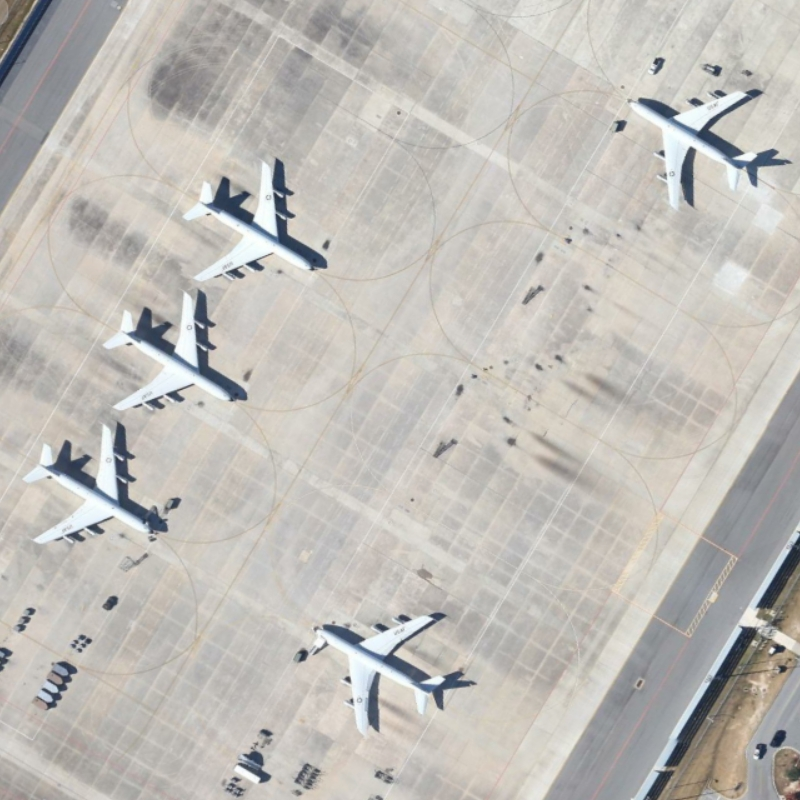
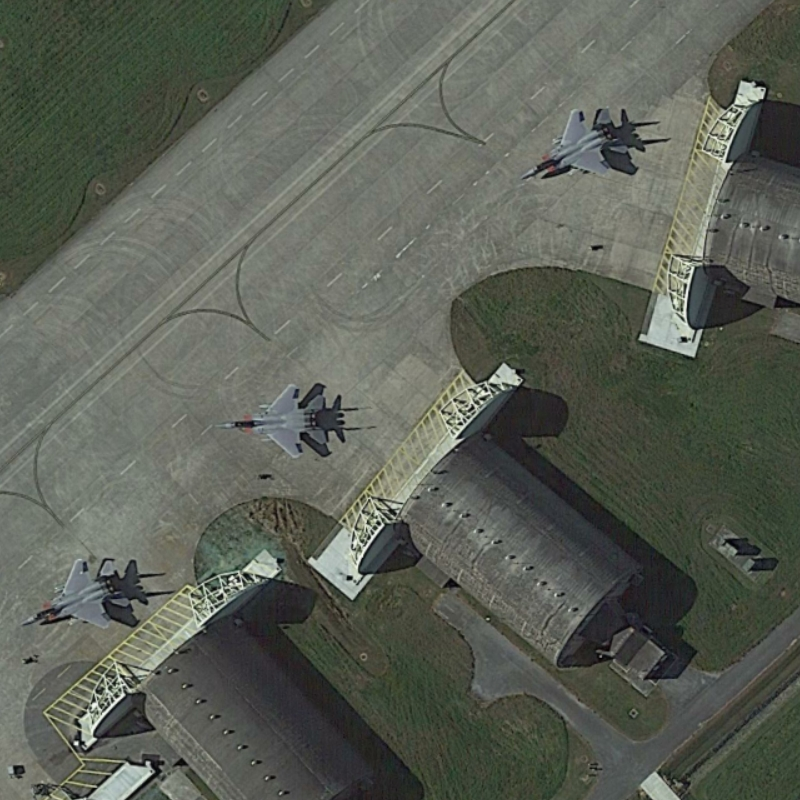
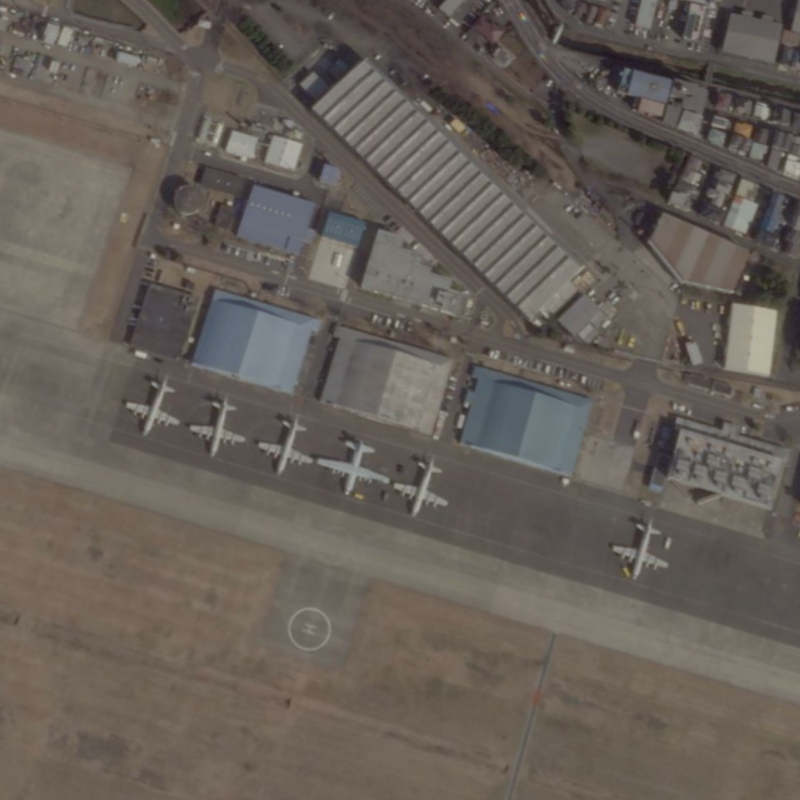
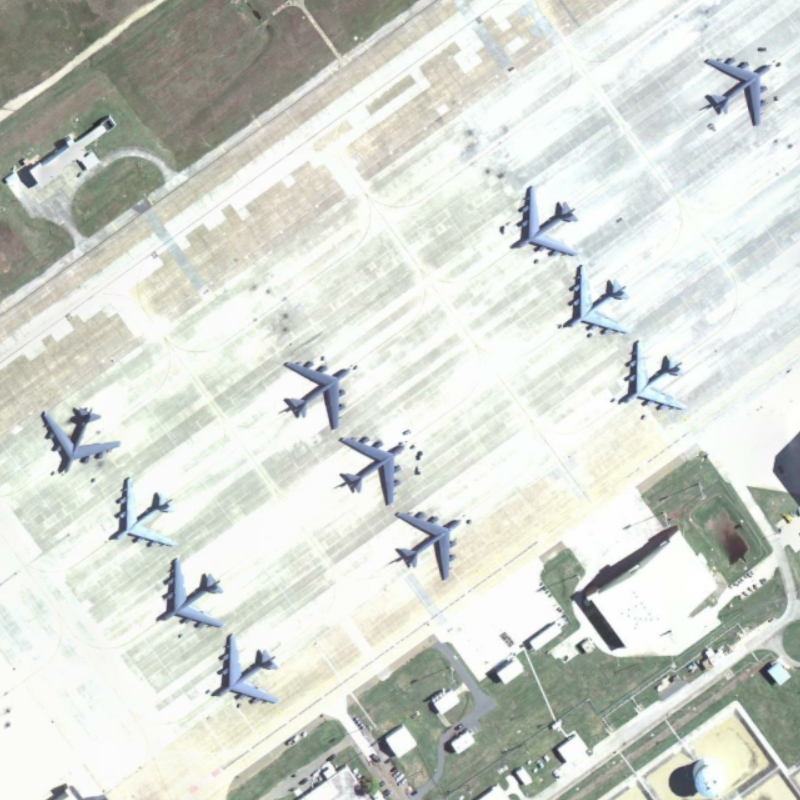
...
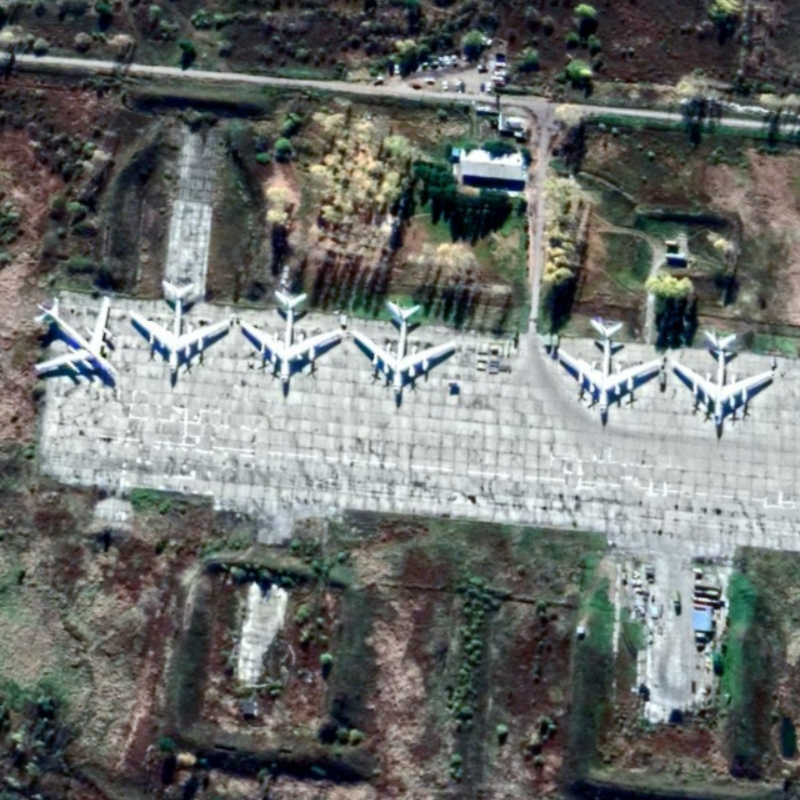
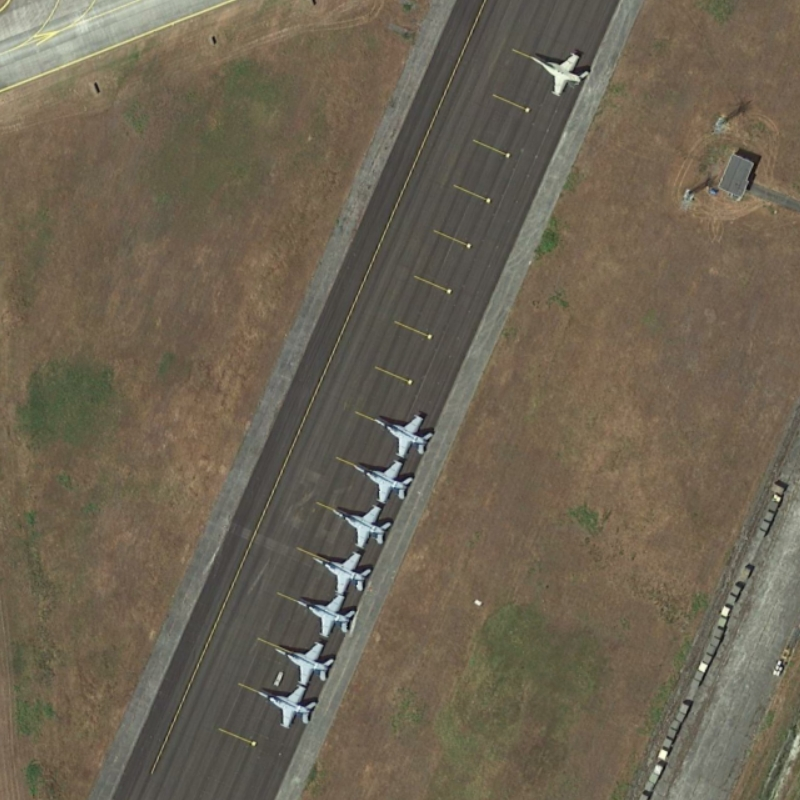
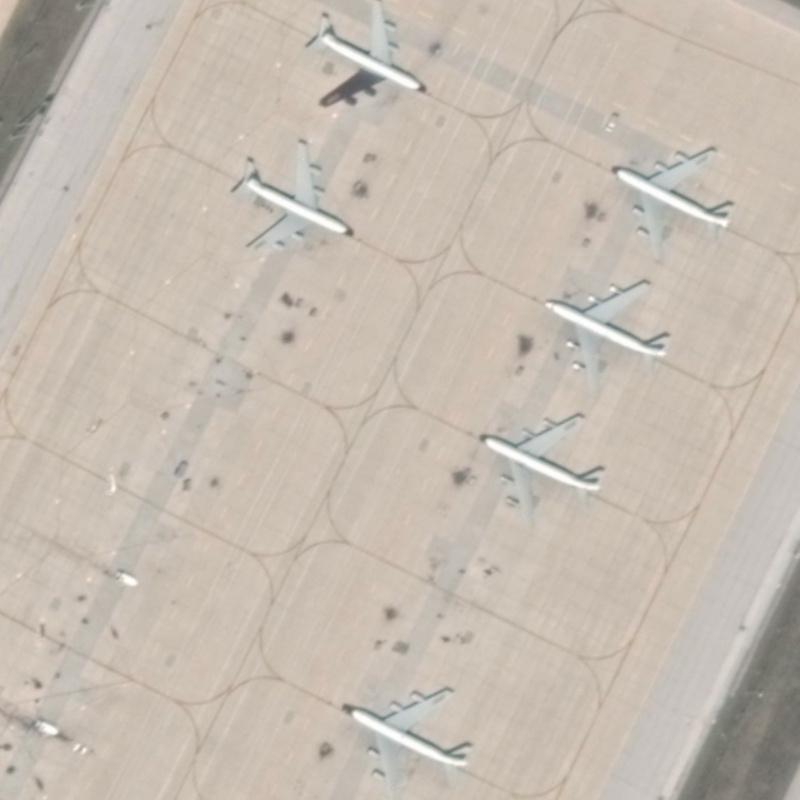
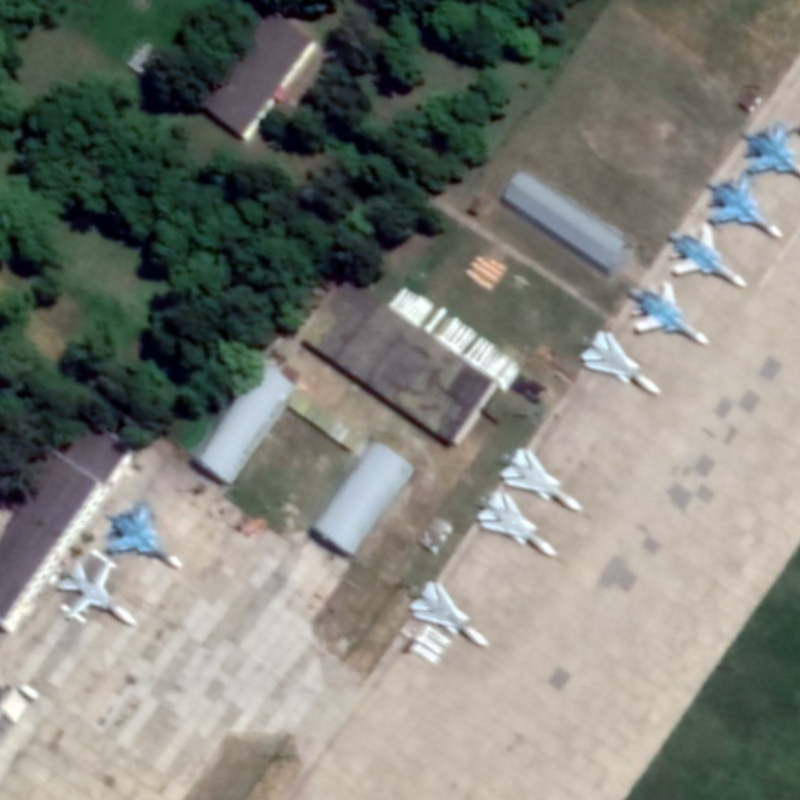
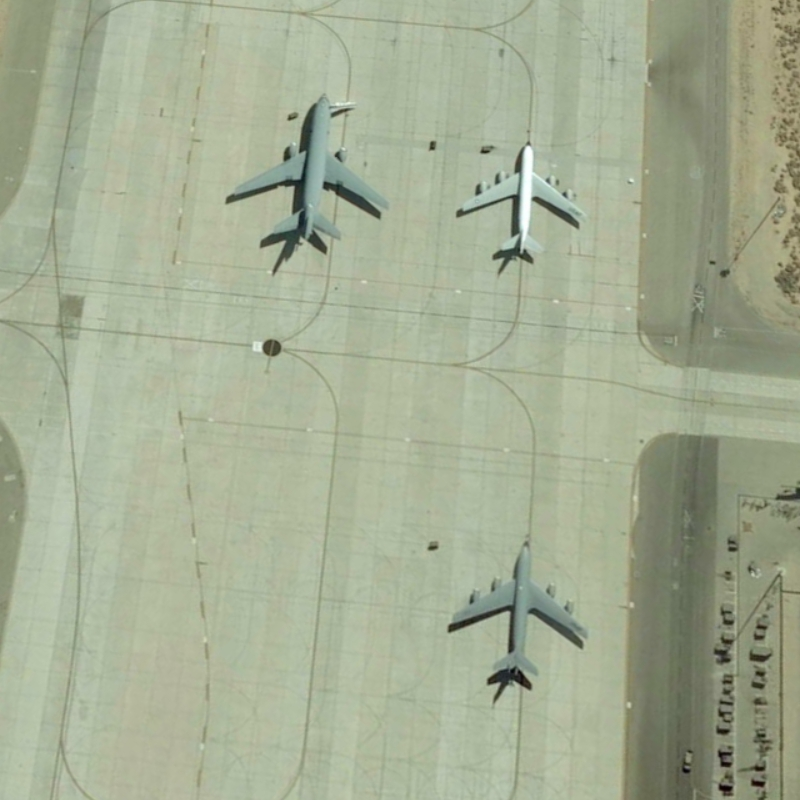

In [ ]:
# Display the images using ipyplot
ipyplot.plot_images(image_list, img_width=150,force_b64=True)

# **Data Preprocessing**

In [ ]:
# Read annotations from an xml file
def read_annotations(xml_path):
    '''
    This function reads the ‘xml’ files containing the annotations
    Input: path to the xml file
    Output: a list containing the label and the annotations
    '''
    # Parse the XML file
    tree = ET.parse(xml_path)

    # Get the root element of the XML tree
    root = tree.getroot()

    # Initialize an empty list to store the annotations
    annotations = []

    # Loop through <object> elements in the XML
    for obj in root.findall('object'):

        # Extract the label from the <name> element
        name = obj.find('name').text

        # Extract the bounding box coordinates from the <bndbox> element
        bbox = obj.find('bndbox')
        xmin = int(bbox.find('xmin').text)
        ymin = int(bbox.find('ymin').text)
        xmax = int(bbox.find('xmax').text)
        ymax = int(bbox.find('ymax').text)
        annotations.append((name, (xmin, ymin, xmax, ymax)))

    # Return the list of annotations
    return annotations

In [ ]:
# This function reads the images from the files
def read_data(file_names):
    '''
    This function reads the images from the files.
    Returns a tuple:
    data: The data with images an corresponding annotations
    dims: List of all dimensions encountered throughout the dataset
    '''
    # Initialize two empty lists
    data = []
    dims = []

    # Loop over the file names extracted and read the images and annotations
    for file_name in file_names:

        # Get the paths to the files
        img_path = os.path.join(data_dir, 'JPEGImages',
                                file_name + '.jpg')
        xml_path = os.path.join(data_dir, 'Annotations',
                                'Horizontal Bounding Boxes',
                                file_name + '.xml')

        # Read the image
        img = Image.open(img_path)

        # Exclude 4-channel images
        if (np.array(img).shape[2]) != 3:
            continue

        # Extract annotations
        annotations = read_annotations(xml_path)

        # Get the dimensions of all objects and store it for later use
        for annot in annotations:
            width = abs(annot[1][0] - annot[1][2])
            height = abs(annot[1][1] - annot[1][3])
            dims.append(width)
            dims.append(height)

        data.append((img, annotations))


    return data, dims

In [ ]:
# Define the path to the data directory
data_dir = '/content/extracted'

# Read the train and test filenames from the ImageSets/Main folder
with open(os.path.join(data_dir, 'ImageSets/Main/train.txt'), 'r') as f:
    train_filenames = f.read().splitlines()
train_data, train_obj_dims = read_data(train_filenames)


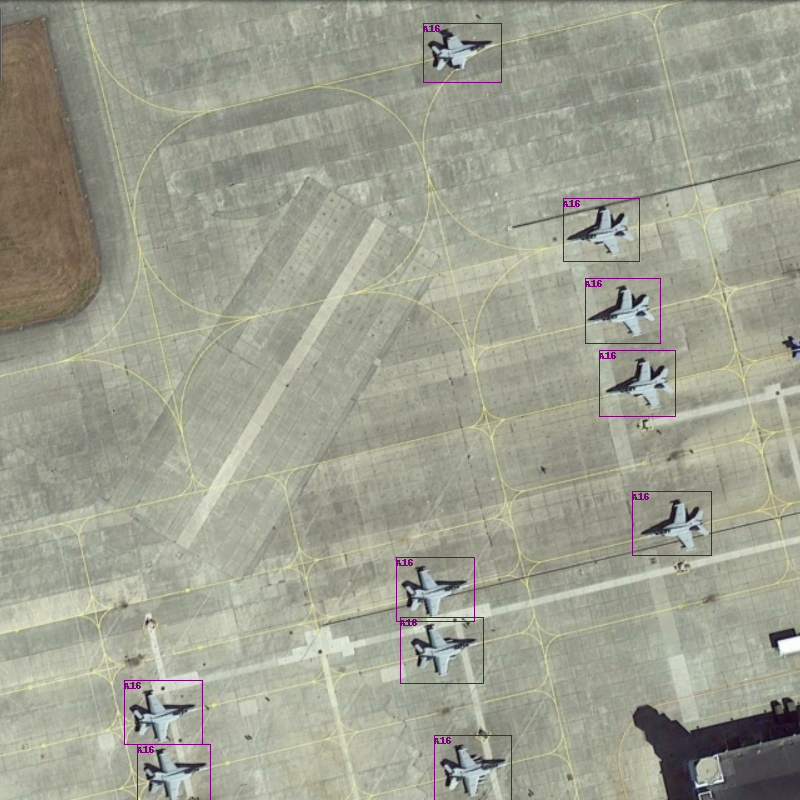

In [ ]:
from PIL import Image, ImageDraw

index_of_next_image = 15 # Change this index based on your dataset structure
img = train_data[index_of_next_image][0]
draw = ImageDraw.Draw(img)
objects = train_data[index_of_next_image][1]

for obj in objects:
    # Draw a purple rectangle
    draw.rectangle(obj[1], outline='purple')

    # Draw purple text at the top-left corner of the rectangle
    draw.text((obj[1][0], obj[1][1]), obj[0], fill='purple')

# Show the modified image
img


In [ ]:
def pad_img(img):
    # Get the dimensions the image
    old_size = img.size

    # Define the desired size to transform the image to
    desired_size = (64,64)

    # Calculate the maximum dimension of the original image
    max_dim = max(old_size)

    # Create a new image with the max_dim as the width and height
    padded = Image.new("RGB", (max_dim, max_dim))

    # Calculate the padding for the image to make it square
    x = (max_dim - old_size[0]) // 2
    y = (max_dim - old_size[1]) // 2

    # Paste the original image onto the padded image at the calculated position
    padded.paste(img, (x, y))

    # Resize the padded image to the desired size
    out_img = padded.resize(desired_size)

    # Return the transformed image
    return out_img

In [ ]:
def extract_obj(img, annotations):
    # Define lists to keep objects in an image and their labels
    objects = []
    labels = []

    # Loop through annotations, each of which contain a label and
    # a bounding box denoted by 'b_box'
    for label, b_box in annotations:
        labels.append(label)
        roi = img.crop(b_box)

        # Add roi to the list
        objects.append(roi)


    # Convert labels to numpy array
    labels = np.array(labels)

    # Return objects as individual images as well as their labels
    return objects, labels

In [ ]:
def preprocessing(data):

    # Define two temporary lists to store objects and labels
    X_temp = []
    y_temp = []

    # Iterate over images and annotations to prepare X_train and y_train
    for img, annotations in data:

        # Extract the objects from current image
        objects, labels = extract_obj(img, annotations)

        # Pad objects
        padded = []
        for obj in objects:
            padded_img = pad_img(obj)
            padded.append(padded_img)

        # Add the objects to two temporary lists
        X_temp.append(padded)
        y_temp.append(labels)

    # Flatten the list of labels and convert to numpy array
    orig_labels = list(itertools.chain(*y_temp))
    orig_labels_np = np.array(orig_labels).reshape(-1, 1)

    # Encode the labels
    encoder = OneHotEncoder()
    y = encoder.fit_transform(orig_labels_np).toarray()

    n_channels = 3

    X_list = []

    # Normalize and create a list of image arrays
    for img in X_temp:
        for obj in img:
            X_list.append(np.array(obj)/255.0)

    # Convert the list of images to an array
    X = np.array(X_list)

    return X, y, orig_labels_np

In [ ]:
# Get features and labels
X, y, orig_labels = preprocessing(train_data)
n_labels = y.shape[1]




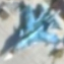
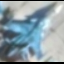
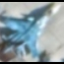
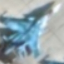
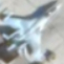


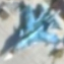
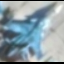
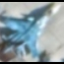
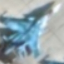
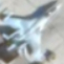

In [ ]:
ipyplot.plot_images(X[:5], img_width=150,force_b64=True)

In [ ]:
# Train/Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.33, random_state=42)

# Shape check
print(f"X_train.shape: {X_train.shape}")
print(f"y_train.shape: {y_train.shape}")
print(f"X_test.shape: {X_test.shape}")
print(f"y_test.shape: {y_test.shape}")

X_train.shape: (5234, 64, 64, 3)
y_train.shape: (5234, 20)
X_test.shape: (2578, 64, 64, 3)
y_test.shape: (2578, 20)


# Model Design Architecture

1. Convolutional Layers (Conv2D):

The first Conv2D layer has 32 filters with a kernel size of (3, 3), generating feature maps of size (62, 62, 32).
The second Conv2D layer has 64 filters with a kernel size of (3, 3), resulting in feature maps of size (29, 29, 64).
2. Average Pooling Layers (AveragePooling2D):

After each Conv2D layer, there is an AveragePooling2D layer that reduces the spatial dimensions of the feature maps by half, helping in capturing important information.
3. Flattening Layer (Flatten):

The Flatten layer reshapes the output of the previous layer into a one-dimensional array. In this case, it converts the feature maps into a vector of size 12544.
4. Dense Layers (Dense):

The first Dense layer has 128 neurons with a Rectified Linear Unit (ReLU) activation function, facilitating the learning of complex patterns.
Batch Normalization is applied to the output of the first Dense layer, aiding in faster convergence and mitigating overfitting.
Dropout is applied with a dropout rate of 0.5, reducing overfitting during training.
The final Dense layer has 20 neurons, representing the output classes.
Model Summary:

Total trainable parameters: 1,628,244 (6.21 MB)
The model has a relatively moderate size, which is beneficial for training efficiency and memory requirements.
Defense of the Model:

Convolutional layers help in capturing spatial hierarchies and local patterns in the input images.
Pooling layers downsample the spatial dimensions, retaining important features and reducing computational complexity.
Batch normalization and dropout enhance the model's generalization capability and reduce overfitting.
The model architecture is a common and effective design for image classification tasks, balancing complexity and performance.
In summary, the provided neural network architecture is a well-structured model for image classification, incorporating convolutional layers for feature extraction, pooling layers for spatial reduction, and dense layers for classification. The inclusion of batch normalization and dropout contributes to the model's robustness and generalization ability.

In [ ]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
def build_model():
    model = keras.Sequential()

    # Initial Convolutional Layer
    model.add(layers.Conv2D(32, (3, 3), activation='relu',
                            input_shape=(64, 64, 3)))
    model.add(layers.AveragePooling2D((2, 2)))

    # Convolutional Layers
    model.add(layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(layers.AveragePooling2D((2, 2)))

    # Flatten before the dense layers
    model.add(layers.Flatten())

    # Dense Layers
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.Dropout(0.5))

    # Output Layer
    model.add(layers.Dense(n_labels, activation='softmax'))

    # Use Adam optimizer with a specific learning rate (e.g., 1e-4)
    optimizer = Adam(learning_rate=1e-4)

    model.compile(optimizer=optimizer,
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    return model

In [ ]:

early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Build the model
model = build_model()

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 62, 62, 32)        896       
                                                                 
 average_pooling2d_2 (Avera  (None, 31, 31, 32)        0         
 gePooling2D)                                                    
                                                                 
 conv2d_3 (Conv2D)           (None, 29, 29, 64)        18496     
                                                                 
 average_pooling2d_3 (Avera  (None, 14, 14, 64)        0         
 gePooling2D)                                                    
                                                                 
 flatten_1 (Flatten)         (None, 12544)             0         
                                                                 
 dense_1 (Dense)             (None, 128)              

In [ ]:
# Train the model
history = model.fit(
    X_train,
    y_train,
    epochs=25,  # Adjust the number of epochs as needed
    validation_data=(X_test, y_test),
    callbacks=[early_stopping],  # Add any other callbacks if needed
)

Epoch 1/25
164/164 [==============================] - 2s 11ms/step - loss: 0.1673 - accuracy: 0.9775 - val_loss: 0.3827 - val_accuracy: 0.8898
Epoch 2/25
164/164 [==============================] - 1s 8ms/step - loss: 0.1504 - accuracy: 0.9771 - val_loss: 0.3580 - val_accuracy: 0.8999
Epoch 3/25
164/164 [==============================] - 2s 12ms/step - loss: 0.1366 - accuracy: 0.9799 - val_loss: 0.3620 - val_accuracy: 0.8929
Epoch 4/25
164/164 [==============================] - 1s 8ms/step - loss: 0.1286 - accuracy: 0.9818 - val_loss: 0.3563 - val_accuracy: 0.8976
Epoch 5/25
164/164 [==============================] - 1s 8ms/step - loss: 0.1135 - accuracy: 0.9847 - val_loss: 0.3455 - val_accuracy: 0.8964
Epoch 6/25
164/164 [==============================] - 1s 8ms/step - loss: 0.1052 - accuracy: 0.9861 - val_loss: 0.3512 - val_accuracy: 0.8960
Epoch 7/25
164/164 [==============================] - 1s 8ms/step - loss: 0.0919 - accuracy: 0.9904 - val_loss: 0.3524 - val_accuracy: 0.8972
Epoc

In [ ]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(X_test, y_test)

print(f"Test Accuracy: {test_acc * 100:.2f}%")

81/81 [==============================] - 0s 4ms/step - loss: 0.3455 - accuracy: 0.8964
Test Accuracy: 89.64%


In [ ]:
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

81/81 [==============================] - 0s 4ms/step - loss: 0.3455 - accuracy: 0.8964
Test Loss: 0.3455018997192383
Test Accuracy: 0.8964313268661499


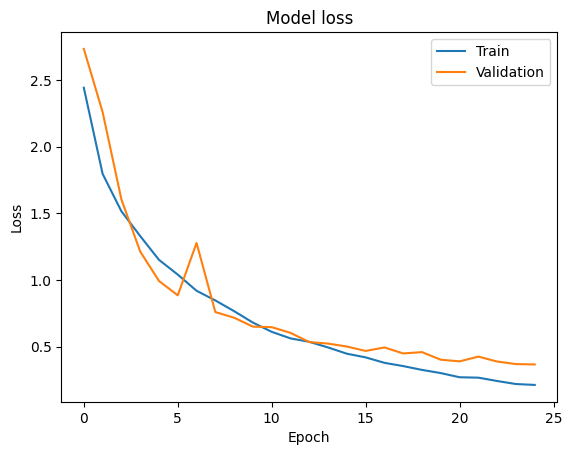

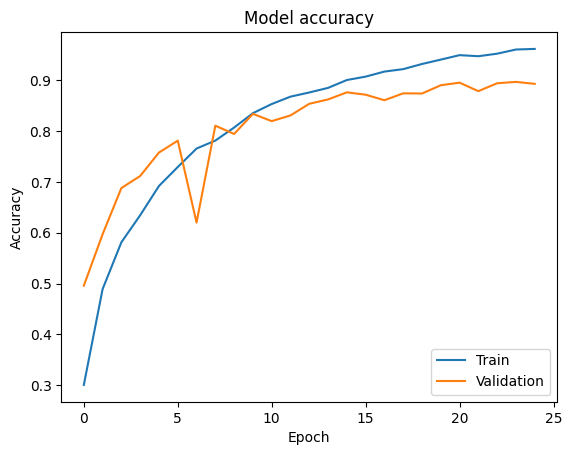

In [ ]:
plt.plot(history_adjusted.history['loss'])
plt.plot(history_adjusted.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

plt.plot(history_adjusted.history['accuracy'])
plt.plot(history_adjusted.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.show()

81/81 [==============================] - 0s 3ms/step


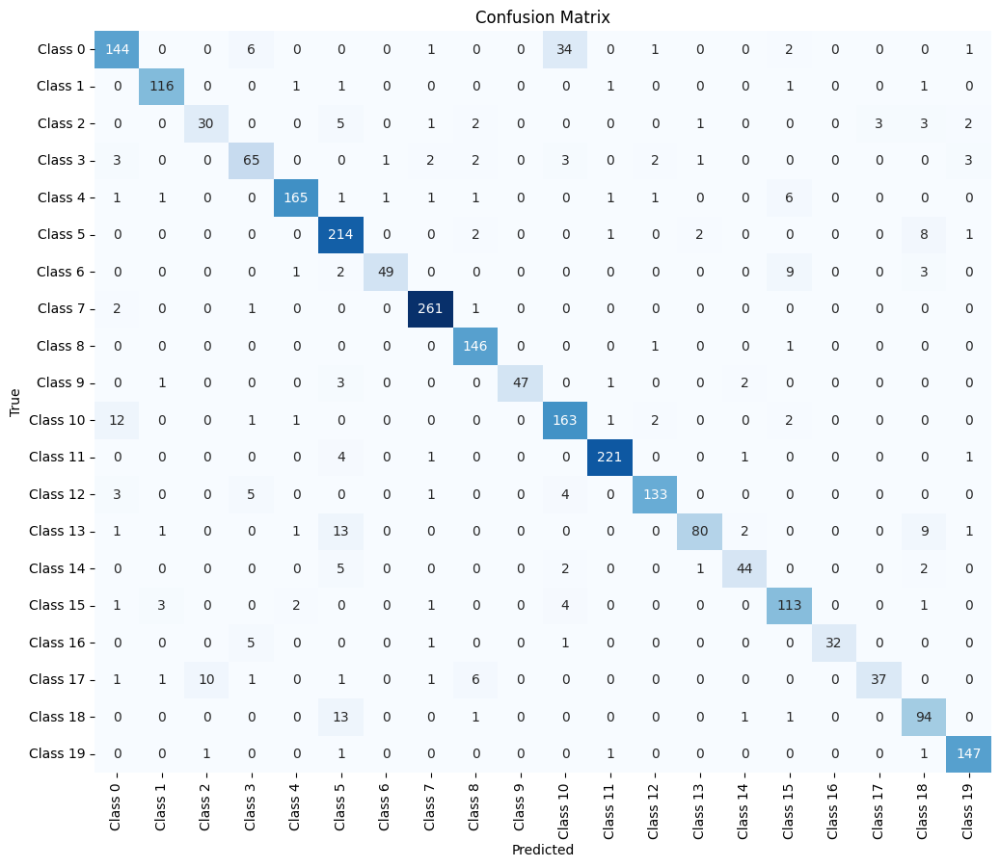

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'adjusted_model' is your trained model and 'X_test' contains your test data

# Get predictions from the model
y_pred = adjusted_model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convert predicted probabilities to class labels

# Convert true labels to class labels
y_true_classes = np.argmax(y_test, axis=1)

# Create confusion matrix
conf_matrix = confusion_matrix(y_true_classes, y_pred_classes)

# Define class labels (replace with your actual class labels)
class_labels = ['Class 0', 'Class 1', 'Class 2', 'Class 3', 'Class 4', 'Class 5', 'Class 6', 'Class 7', 'Class 8', 'Class 9',
                'Class 10', 'Class 11', 'Class 12', 'Class 13', 'Class 14', 'Class 15', 'Class 16', 'Class 17', 'Class 18', 'Class 19']

# Plot confusion matrix
plt.figure(figsize=(12, 10))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=class_labels,
            yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


In [ ]:
from tensorflow.keras.models import save_model, load_model

# Assuming 'adjusted_model' is your trained model

# Save the model
save_model(adjusted_model, '/content/drive/MyDrive/image_classification.h5')

# Load the model
#loaded_model = load_model('path/to/your/model.h5')

<ipython-input-42-91ec71ec45dc>:6: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  save_model(adjusted_model, '/content/drive/MyDrive/Fake news/image_classification.h5')
